# Augment Polygons

`imgaug` has native support for polygon augmentation (currently in Beta state). The following classes are relevant:

`imgaug.Polygon(exterior, [label])`: Container for a single polygon. The exterior is the "border" of the polygon and made up of corner points, e.g. `Polygon([(0, 0), (10, 0), (10, 10)])` creates a triangle (each point is given as `(x, y)` in absolute (sub-)pixel coordinates.
* Properties offered by `Polygon` are: `.exterior` (all corner points), `.label` (the polygon's class label, may be `None`), `.xx` (x-coordinates of all corner points), `.yy` (analogous), `.xx_int` (`.xx` rounded to integers), `.yy_int` (analogous), ( `.height` (height of the polygon), `.width` (analogous), `.area` (area of the polygon) and `.is_valid` (returns whether the polygon is valid, i.e. has no self-intersections or overlapping segments).
* Methods offered by `Polygon` are:
  * `project(from_shape, to_shape)`: Project the polygon from image shape `from_shape` onto image shape `to_shape`, i.e. change the corner point coordinates. This is useful when resizing images.
  * `find_closest_point_index(x, y, return_distance=False)`: For a given coordinate, find the index of the closest corner point (according to euclidean distance).
  * `is_fully_within_image(image)`: Returns whether no corner point is outside the image plane.
  * `is_partly_within_image(image)`: Returns whether at least one corner point is inside the image plane.
  * `is_out_of_image(image, fully=True, partly=False)`: Returns whether all corner points are outside the image plane (`fully=True`) or some of them (`partly=True`) or either case (`fully=True, partly=True`).
  * `clip_out_of_image(image)`: Clips off parts of the polygon that are outside of the image plane.
  * `shift(top=None, right=None, bottom=None, left=None)`: Shift the polygon from the top/right/bottom/left side, i.e. move it around on the image.
  * `draw_on_image(image, color=(0, 255, 0), color_fill=None, color_perimeter=None, color_points=None, alpha=1.0, alpha_fill=None, alpha_perimeter=None, alpha_points=None, size_points=3, raise_if_out_of_image=False)`: Draw the polygon on a given image. This will draw an inner area ("fill"), a border ("perimeter") and the corner points ("points").
  * `extract_from_image(image)`: Extract pixels within the polygon from an image. Returns a rectangle matches the dimensions of a bounding box around the polygon. All pixels that were not inside the polygon are set to zero (i.e. black).
  * `change_first_point_by_coords(x, y, max_distance=1e-4, raise_if_too_far_away=True)`: Reorders the points in `.exterior` so that the closest one to a given coordinate becomes the first point.
  * `change_first_point_by_index(point_idx)`: Reorders the points in `.exterior` so that the one with a given index becomes the first point.
  * `to_shapely_polygon()`: Converts this `Polygon` instance to a `shapely.Polygon` instance.
  * `to_shapely_line_string(closed=False, interpolate=0)`: Converts this `Polygon` instance to a `shapely.LineString` instance.
  * `to_bounding_box()`: Converts this `Polygon` instance to an `imgaug.BoundingBox` instance.
  * `to_keypoints()`: Converts this `Polygon`'s corner points to `imgaug.Keypoint` instances.
  * `from_shapely(polygon_shapely, label=None)`: Creates an `imgaug.Polygon` instance from a `shapely.Polygon` instance.
  * `exterior_almost_equals(other_polygon, max_distance=1e-6, interpolate=8)`: Compares this polygon's exterior with another polygon's exterior (may be a `Polygon` instance or its corner points). Returns `True` if the exteriors are practically identical.
  * `almost_equals(other, max_distance=1e-6, interpolate=8)`: Same as `exterior_almost_equals()` but also compares `.label`.
  * `copy(exterior=None, label=None)`: Currently an alias for `.deepcopy()`.
  * `deepcopy(self, exterior=None, label=None)`: Creates a deep copy of this polygon instance. If `exterior` or `label` are not `None`, they will be assigned to the new instance.
  

`imgaug.PolygonsOnImage(polygons, shape)`: Container for a set of polygons (`imgaug.Polygon` instances) placed on a single image. The image's shape must be provided as a tuple via the argument `shape` and is required during the augmentation to align polygon and image augmentation (e.g. to sample corresponding crop values).
* Properties of `PolygonsOnImage` are: `.polygons`, `.shape`, `.empty` (same as `len(.polygons) == 0`).
* Methods of `PolygonsOnImage` are:
  * `on(self, image):`: Calls `project(...)` on each polygon in `.polygons`.
  * `draw_on_image(...)`: Calls `draw_on_image(...)` on each polygon in `.polygons`.
  * `remove_out_of_image(self, fully=True, partly=False)`: Removes all polygons from `.polygons` that partially and/or fully outside of the image plane.
  * `clip_out_of_image()`: Calls `clip_out_of_image()` on each polygon in `.polygons`. This can increase the number of polygons in `.polygons`.
  * `shift(...)`: Calls `shift(...)` on each polygon in `.polygons`.
  * `copy()`: Currently an alias for `.deepcopy()`.
  * `deepcopy()`: Creates a deep copy of this instance.

Polygons can be augmented using `augment_polygons(polygons_on_images)`, which is offered by all augmenters. It expects either a single instance of `PolygonsOnImage` or a list of it. It does *not* accept `Polygon` instances, because these lack the necessary image shape information in the form of `.shape`. Note that only augmentations that change the geometry affect polygons, e.g. affine transformations, cropping or horizontal flipping. Other augmentations, e.g. gaussian noise, only affect images.

Most of the mentioned methods are explained below. The [API](https://imgaug.readthedocs.io/en/latest/source/api.html) also contains further details ([Polygon](https://imgaug.readthedocs.io/en/latest/source/api_imgaug.html#imgaug.imgaug.Polygon), [PolygonsOnImage](https://imgaug.readthedocs.io/en/latest/source/api_imgaug.html#imgaug.imgaug.PolygonsOnImage), [imgaug.augmenters.meta.Augmenter.augment_polygons()](https://imgaug.readthedocs.io/en/latest/source/api_augmenters_meta.html#imgaug.augmenters.meta.Augmenter.augment_polygons)).

## Placing Polygons on an Image

To show off the polygon augmentation functionality, we need an example image with some polygons on it. Let's load an image from wikipedia:

(571, 856, 3)


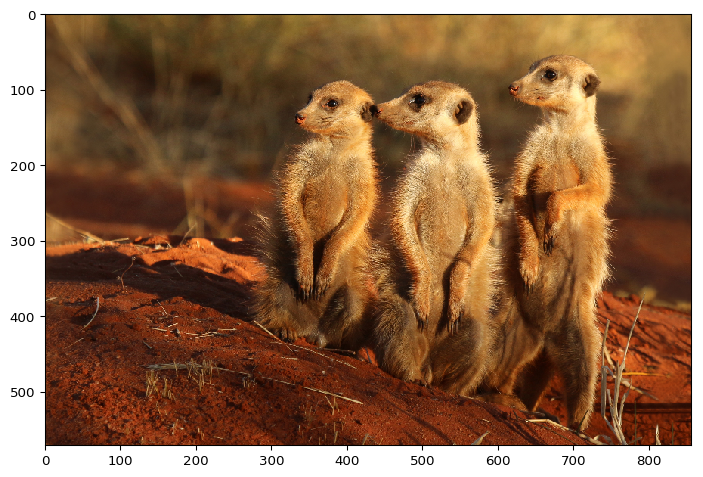

In [1]:
import imageio
import imgaug as ia
%matplotlib inline

image = imageio.imread("https://upload.wikimedia.org/wikipedia/commons/9/9a/Meerkat_%28Suricata_suricatta%29_Tswalu.jpg")
image = ia.imresize_single_image(image, 0.25)
print(image.shape)

ia.imshow(image)

We will now create three polygons, one for each of the three meerkats. Each polygon is created as `Polygon(exterior)`, where `exterior` is a list of absolute (sub-)pixel xy-coordinates (given as tuples) describing the polygon corner points. Finding these corner points manually is a bit tedious. Usually they are supposed to be part of the dataset.

In [2]:
# left meerkat
meerkat_left = ia.Polygon([
    (350, 100),  # top left
    (390, 85),  # top
    (435, 110),  # top right
    (435, 170),
    (445, 250),  # right elbow
    (430, 290),  # right hip
    (440, 300),
    (420, 340),
    (440, 400),
    (410, 450),  # right foot
    (320, 430),
    (280, 410),  # left foot
    (300, 350),
    (300, 210),  # left elbow
    (340, 160),
    (325, 140)  # nose
])

# center meerkat
meerkat_center = ia.Polygon([
    (430, 120),  # left top (nose)
    (510, 90),  # top
    (550, 95),  # top right
    (570, 120),  # ear
    (600, 230),
    (600, 450),
    (560, 510),  # bottom right
    (450, 480),  # bottom left
    (430, 340),
    (450, 250),  # elbow
    (500, 165),  # neck
    (430, 145)
])

# right meerkat
meerkat_right = ia.Polygon([
    (610, 95),  # nose top
    (650, 60),  # top
    (680, 50),  # top
    (710, 60),
    (730, 80),  # top right
    (730, 140),
    (755, 220),
    (750, 340),
    (730, 380),
    (740, 420),
    (715, 560),  # right foot
    (690, 550),
    (680, 470),
    (640, 530),
    (590, 500),  # left foot
    (605, 240),  # left elbow
    (655, 130),  # neck
    (620, 120),  # mouth, bottom
])


Now that we have the three polygons created, let's draw them on the image. We use the method `Polygon.draw_on_image(image)` to do that and `imgaug.imshow()` to show the drawn image.

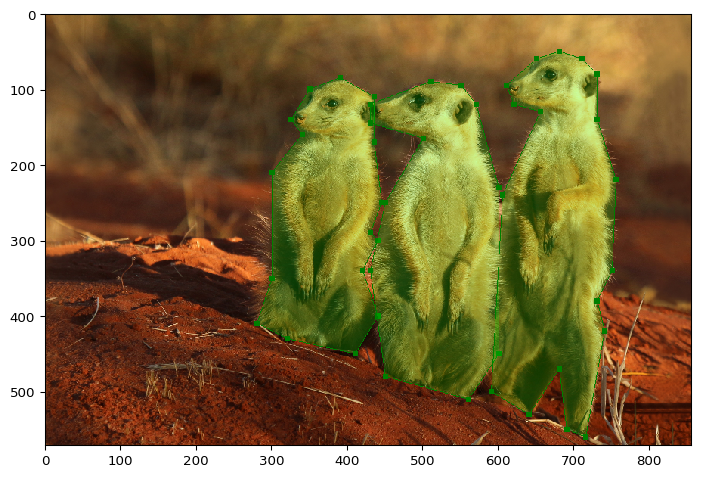

In [3]:
import numpy as np
image_polys = np.copy(image)
image_polys = meerkat_left.draw_on_image(image_polys, alpha_fill=0.2, size_points=7)
image_polys = meerkat_center.draw_on_image(image_polys, alpha_fill=0.2, size_points=7)
image_polys = meerkat_right.draw_on_image(image_polys, alpha_fill=0.2, size_points=7)
ia.imshow(image_polys)

## Augmenting the Example Image and Polygons

Now we want to augment the image and the polygons on it. We do this by creating one or more augmenter instances and calling `augment_image(image)` on them for the image augmentation and `augment_polygons(polygons)` for the polygons. However, `augment_polygons()` does not accept `Polygon` instances, only `PolygonsOnImage` instances (one per image). This is because `Polygon` lacks information about the image size, which `PolygonOnImage` offers in the the form of its `.shape` attribute. So let's convert our polygons to an `PolygonsOnImage` instance:

In [4]:
psoi = ia.PolygonsOnImage([meerkat_left, meerkat_center, meerkat_right],
                          shape=image.shape)

Now we want to perform our first augmentation. We simply apply a bit of gaussian noise, coarse dropout and some color changes to the image. None of these are geometric augmentations, hence they will not affect the polygons. Note that we have to switch our augmentation pipeline to deterministic mode here, as we want to use the same random sates twice: once for the image and once for the polygons. Without this switch to deterministic mode, we would get different random number samples for image and polygon augmentation. (Which wouldn't matter in this first example, as only the image is affected, but it does matter for all of the examples after that.) For more details, see the notebook on stochastic and deterministic mode.

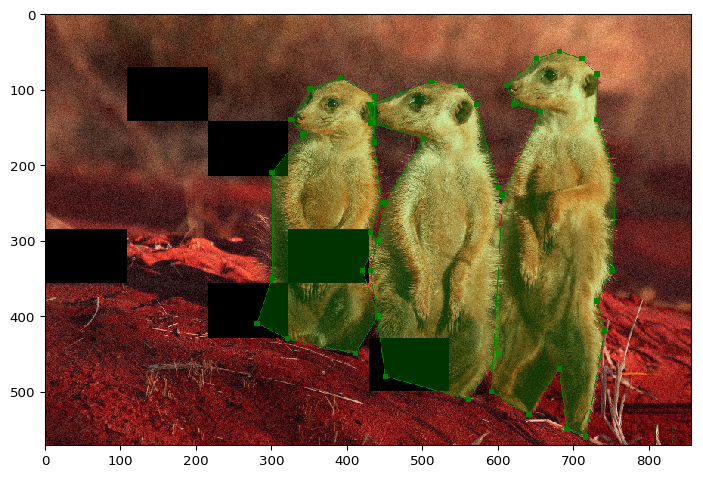

In [5]:
import imgaug.augmenters as iaa
ia.seed(1)

aug = iaa.Sequential([
    iaa.AdditiveGaussianNoise(scale=10),
    iaa.CoarseDropout(0.1, size_px=8),
    iaa.AddToHueAndSaturation((-50, 50))
])

aug_det = aug.to_deterministic()
image_aug = aug_det.augment_image(image)
psoi_aug = aug_det.augment_polygons(psoi)

ia.imshow(psoi_aug.draw_on_image(image_aug, alpha_fill=0.2, size_points=7))

Let's now pick an augmentation pipeline that actually modifies the polygons. We choose affine translation and horizontal flips:

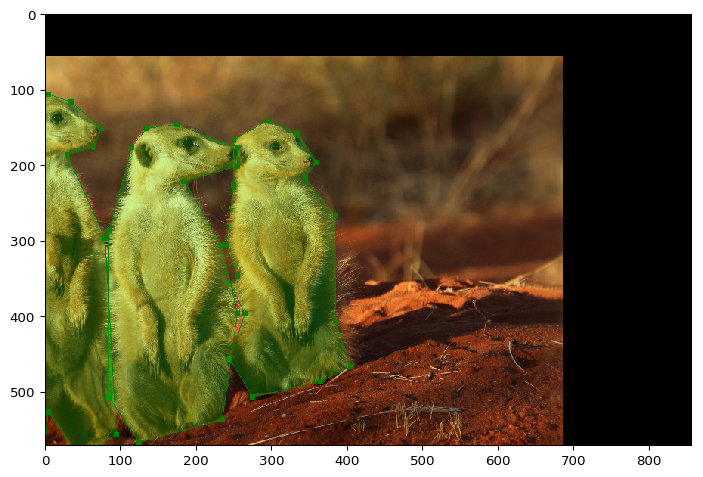

In [6]:
aug = iaa.Sequential([
    iaa.Affine(translate_percent={"x": 0.2, "y": 0.1}),
    iaa.Fliplr(1.0)
])

aug_det = aug.to_deterministic()
image_aug = aug_det.augment_image(image)
psoi_aug = aug_det.augment_polygons(psoi)

ia.imshow(psoi_aug.draw_on_image(image_aug, alpha_fill=0.2, size_points=7))

Easy as that. In case we ever need the polygon's corner points again, they are accessible via `PolygonsOnImage.polygons[index].exterior`, which is an `(N, 2)` array. `imgaug` will try its best to keep the order of the points unchanged, but this is not always guaranteed. Occassionally, the number of corner points can also change.

Quite often, (axis-aligned) bounding boxes are used instead of polygons. These bounding boxes can develop unexpected shapes upon augmentation, especially when rotations are involved. The below example transforms the polygons to bounding boxes, then augments image, bounding boxes and polygons and visualizes the results. The bounding boxes end up looking weird (even though they are correct! see the notebook on bounding boxes for details), while the polygons keep their tight fit around the objects.

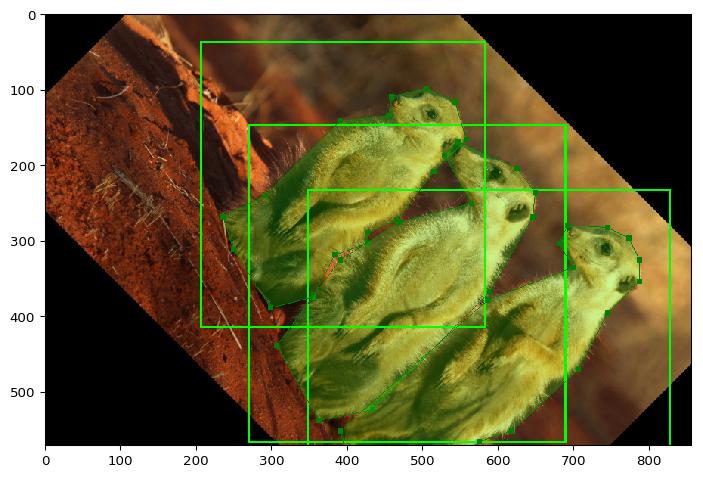

In [7]:
aug = iaa.Affine(rotate=45)

aug_det = aug.to_deterministic()
image_aug = aug_det.augment_image(image)
bbsoi_aug = aug_det.augment_bounding_boxes(
    ia.BoundingBoxesOnImage(
        [polygon.to_bounding_box() for polygon in psoi.polygons],
        shape=image.shape
    )
)
psoi_aug = aug_det.augment_polygons(psoi)

ia.imshow(
    psoi_aug.draw_on_image(
        bbsoi_aug.draw_on_image(image_aug, thickness=3),
        alpha_fill=0.2, size_points=7
    )
)

## Many Consecutive Augmentations

In the above examples, we always just operated with one "batch". In the real world, we will want to augment many batches. This following code black shows an example with an augmentation loop. It also applies a more complex augmentation pipeline.

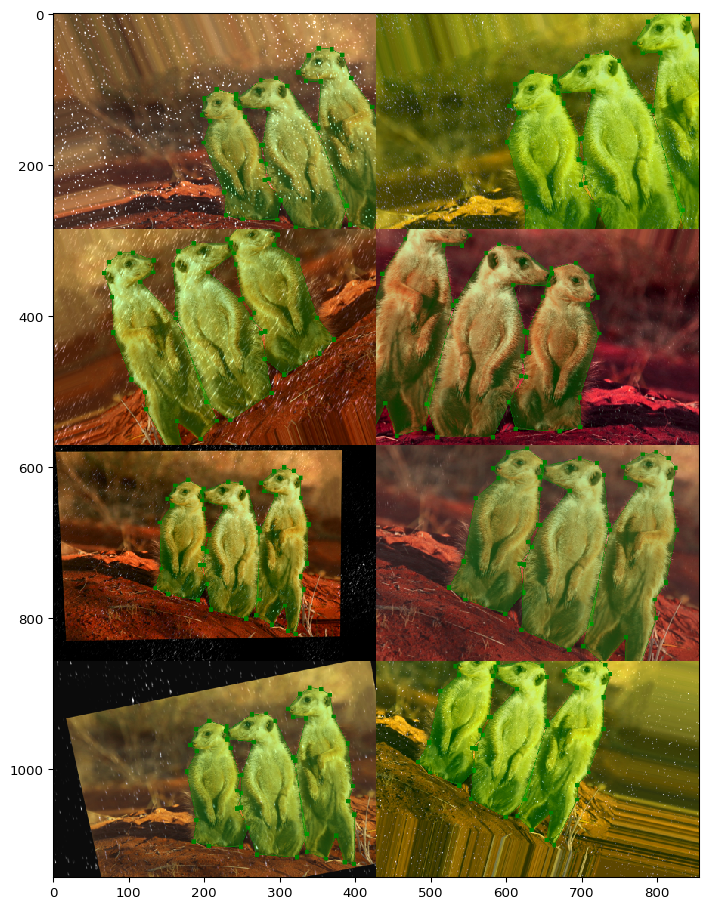

In [8]:
ia.seed(2)
aug = iaa.Sequential([
    iaa.Affine(rotate=(-20, 20), translate_percent=(-0.2, 0.2), scale=(0.8, 1.2),
               mode=["constant", "edge"], cval=0),
    iaa.Fliplr(0.5),
    iaa.PerspectiveTransform((0.01, 0.1)),
    iaa.AddToHueAndSaturation((-20, 20)),
    iaa.LinearContrast((0.8, 1.2), per_channel=0.5),
    iaa.Sometimes(0.75, iaa.Snowflakes())
])

images_polys_aug = []
for _ in range(2*4):
    aug_det = aug.to_deterministic()  # call this once *per loop iteration*!
    image_aug = aug_det.augment_image(image)
    psoi_aug = aug_det.augment_polygons(psoi)
    image_polys_aug = psoi_aug.draw_on_image(image_aug, alpha_fill=0.2, size_points=11)
    images_polys_aug.append(ia.imresize_single_image(image_polys_aug, 0.5))

ia.imshow(ia.draw_grid(images_polys_aug, cols=2))

Note that we could have achieved the same as above without a loop by just calling `aug_det.augment_images([image] * (2*4))` and `aug_det.augment_polygons([psoi] * (2*4))`. For the sake of the example we used the more complex form.

## Keeping Polygons Valid

Some methods that operate on polygons may require them to be *valid* (i.e. "concave"). A polygon is valid if it has at least three corner points, does not self-intersect and has no segments that are overlapping. Particularly the self-intersection criterion is problematic for the case of augmentation, as some techniques may shift corner points in a way that leads to self-intersection. This is currently the case in `imgaug` for `ElasticTransformation` and `PiecewiseAffine`. For these augmenters, `imgaug` automatically verifies after augmentation whether the polygons are still valid. If they are not, it will try to repair them. While it will do its best to keep the old shape as much as possible, you should be under no illusion that this is an error-prone process that may result in polygons that are technically valid, but appear broken to a human (and don't match the object anymore). Though it will always produce at least some valid polygon (and may fall back to the convex hull to achieve that). Polygon repairing can also be a slow process, particularly when the polygon has many corner points. Because of these factors, one should reduce the likelihood of getting invalid polygons as much as possible. This can be achieved by (a) not using `ElasticTransformation` or `PiecewiseAffine` or (b) reducing the strength of these augmenters (`alpha` is `ElasticTransformation` and `scale` in `PiecewiseAffine`). Note also that the number of corner points is an influencing factor here. Having many corner points close to each other increases the risk of self-intersections.

The below example applies `ElasticTransformation` at increasing strengths (`alpha=0*200` to `alpha=6*200`) to our example image. It does this without automatic polygon repair (left column) and with polygon repair (right column). As you can see, the repaired polygons often appear visually broken, even though they are technically valid. It is however unlikely to get invalid polygons for low `alpha` values.

Line 0, Alpha=0000 without polygon recoverer ['valid', 'valid', 'valid']
Line 0, Alpha=0000 with polygon recoverer    ['valid', 'valid', 'valid']
Line 1, Alpha=0200 without polygon recoverer ['valid', 'valid', 'valid']
Line 1, Alpha=0200 with polygon recoverer    ['valid', 'valid', 'valid']
Line 2, Alpha=0400 without polygon recoverer ['valid', 'valid', 'valid']
Line 2, Alpha=0400 with polygon recoverer    ['valid', 'valid', 'valid']
Line 3, Alpha=0600 without polygon recoverer ['valid', 'valid', 'valid']
Line 3, Alpha=0600 with polygon recoverer    ['valid', 'valid', 'valid']
Line 4, Alpha=0800 without polygon recoverer ['valid', 'valid', 'INVALID']
Line 4, Alpha=0800 with polygon recoverer    ['valid', 'valid', 'valid']
Line 5, Alpha=1000 without polygon recoverer ['valid', 'valid', 'INVALID']
Line 5, Alpha=1000 with polygon recoverer    ['valid', 'valid', 'valid']
Line 6, Alpha=1200 without polygon recoverer ['valid', 'INVALID', 'INVALID']
Line 6, Alpha=1200 with polygon recoverer  

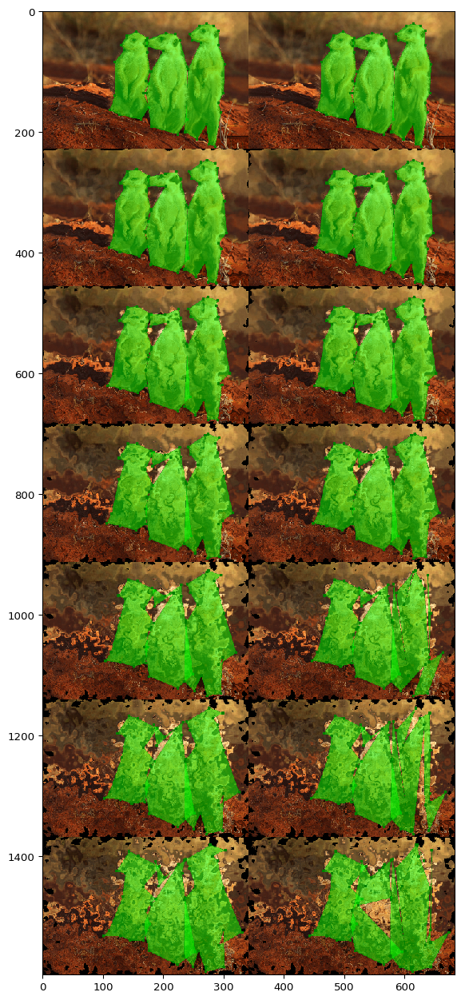

In [9]:
images_polys_aug = []
for i in range(1*7):
    for polygon_recoverer in [None, "auto"]:
        alpha = i * 200
        
        aug = iaa.ElasticTransformation(alpha=alpha, sigma=10, random_state=2,
                                        polygon_recoverer=polygon_recoverer)
        
        aug_det = aug.to_deterministic()
        image_aug = aug_det.augment_image(image)
        psoi_aug = aug_det.augment_polygons(psoi)
        
        image_polys_aug = psoi_aug.draw_on_image(image_aug, size_points=11)
        images_polys_aug.append(ia.imresize_single_image(image_polys_aug, 0.4))
        
        print(
            "Line %d, Alpha=%04d" % (i, alpha),
            "with polygon recoverer   " if polygon_recoverer else "without polygon recoverer",
            ["valid" if poly.is_valid else "INVALID" for poly in psoi_aug.polygons]
        )

ia.imshow(ia.draw_grid(images_polys_aug, cols=2))

## Drawing Polygons

The drawing methods have been used before. They are offered by both `Polygon` and `PolygonsOnImage` with identical interfaces: `draw_on_image(image, color=(0, 255, 0), color_fill=None, color_perimeter=None, color_points=None, alpha=1.0, alpha_fill=None, alpha_perimeter=None, alpha_points=None, size_points=3, raise_if_out_of_image=False)`. They draw the polygon(s) on image `image` and use color `color` and opacity `alpha` for that. The other color values control the inner polygon's area (`color_fill`), the polygon's border (`color_perimeter`) and the polygon's corner point color (`color_points`). They are automatically derived from `color` if they are not set (perimeter and points are a bit darker than the inner polygon area). The behaviour for `alpha_*` is analogous (perimeter and points are less transparent than the inner area). The argument `size_points` controls the size in pixels of each corner point. `raise_if_out_of_image=True` raises an exception if the polygon (or any polygon in the case of `PolygonsOnImage`) is completely outside of the image plane (no corner point inside it).

So let's draw again all of our polygons by calling `PolygonsOnImage.draw_on_image()`:

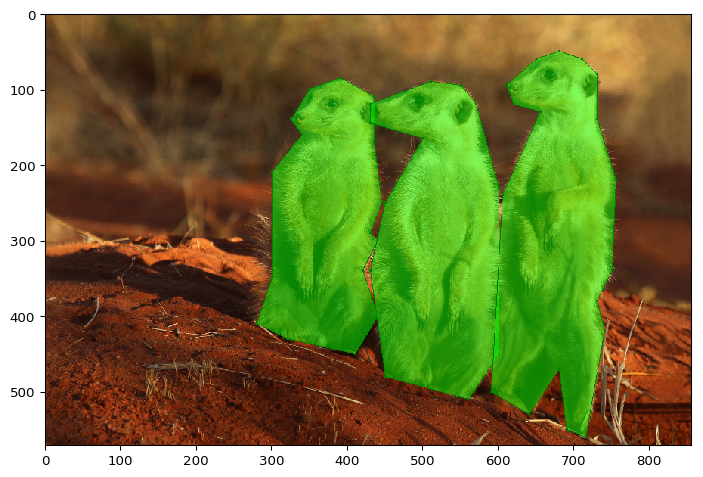

In [10]:
ia.imshow(psoi.draw_on_image(image))

Now let's change the color of each polygon. To do that, we have to call `Polygon.draw_on_image(color=...)` for each of the three polygons (as `PolygonsOnImages.draw_on_image()` currently only supports one color for all polygons):

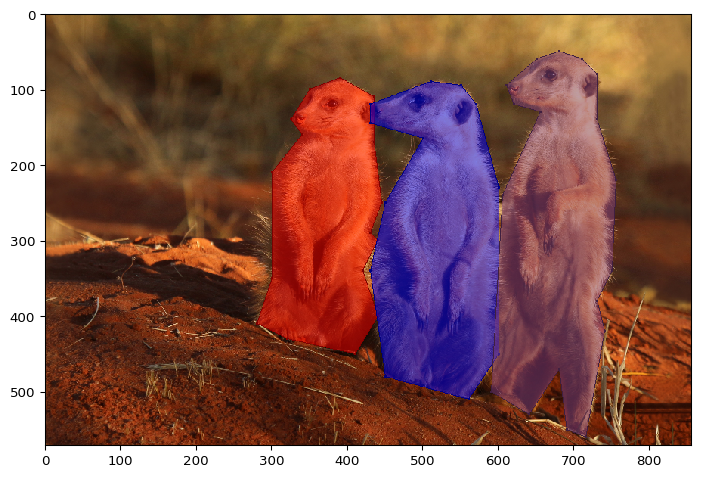

In [11]:
image_polys = np.copy(image)
image_polys = meerkat_left.draw_on_image(image_polys, color=[255, 0, 0])
image_polys = meerkat_center.draw_on_image(image_polys, color=[0, 0, 255])
image_polys = meerkat_right.draw_on_image(image_polys, color=[128, 64, 128])
ia.imshow(image_polys)

Now let's play with different colors for the polygon inner areas, perimeters and corner points. `color` is the default colors for the inner area, perimeter and corner points, unless one of these is overwritten via `color_fill`, `color_perimeter` or `color_points`. `color` defaults to `[0, 255, 0]`. So by setting only `color_points` for the right meerkat, we get green for the inner area and perimeter.

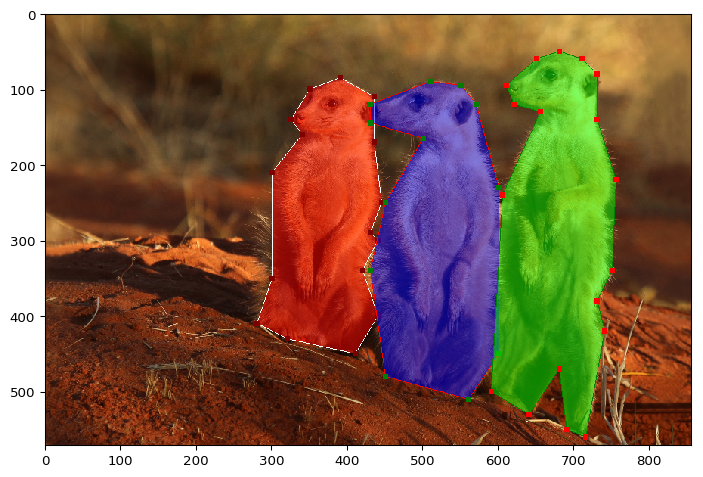

In [12]:
image_polys = np.copy(image)
image_polys = meerkat_left.draw_on_image(image_polys, color=[255, 0, 0], color_perimeter=[255, 255, 255],
                                         size_points=7)
image_polys = meerkat_center.draw_on_image(image_polys, color_fill=[0, 0, 255],
                                           color_perimeter=[255, 0, 0], size_points=7)
image_polys = meerkat_right.draw_on_image(image_polys, color_points=[255, 0, 0], size_points=7)
ia.imshow(image_polys)

We can do the same for `alpha` (and `alpha_fill`, `alpha_perimeter`, `alpha_points`). The argument controls the opacity (i.e. inverse transparency). Values close to `1.0` denote very visible polygons, values close to `0.0` very invisible ones. By default, the inner area's alpha value is derived as `0.5*alpha` from `alpha`.

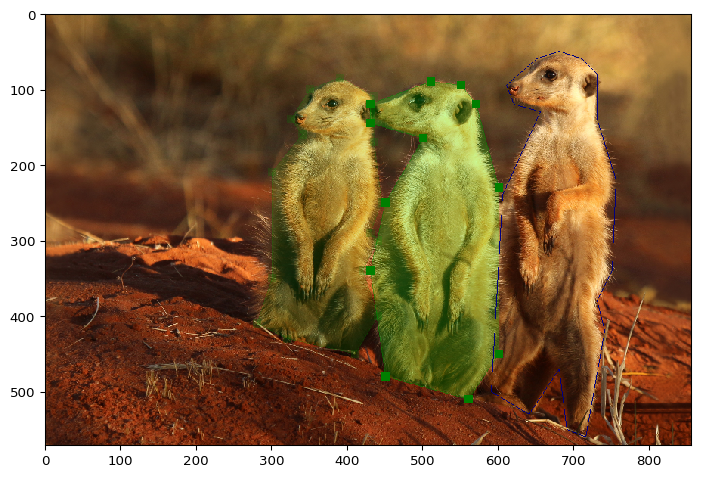

In [13]:
image_polys = np.copy(image)
image_polys = meerkat_left.draw_on_image(image_polys, alpha=0.2, size_points=11)
image_polys = meerkat_center.draw_on_image(image_polys, alpha=0.1,
                                           alpha_perimeter=0.5, alpha_fill=0.2,
                                           alpha_points=1.0, size_points=11)
image_polys = meerkat_right.draw_on_image(image_polys, color=[0, 0, 255], alpha_fill=0, alpha_points=0)
ia.imshow(image_polys)

## Extracting Image Content

In case you ever need only the pixels inside a polygon area, you can use `Polygon.extract_from_image()`. It returns a rectangle matching the axis-aligned bounding box around the polygon and sets within that rectangle all pixels not belonging to the polygon's inner area to zero (i.e. black). If you don't want them to be set to zero, call `Polygon.to_bounding_box().extract_from_image(image)` instead.

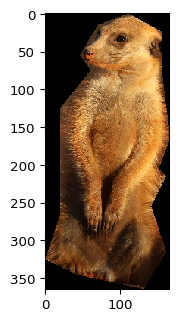

In [14]:
ia.imshow(meerkat_left.extract_from_image(image))

## Clipping Polygons

After augmentation, your polygons may be partially or completely outside of the image plane. You can detect whether this is the case using `Polygon.is_out_of_image(fully=True, partly=False)`. Usually however, you will probably want to clip polygons that are partially outside of the image and remove those that are completely outside. The below examples will show how to do that.

Let's first create a scenario where polygons are translated, leading to one polygon being completely outside of the image and one being partially outside of it:

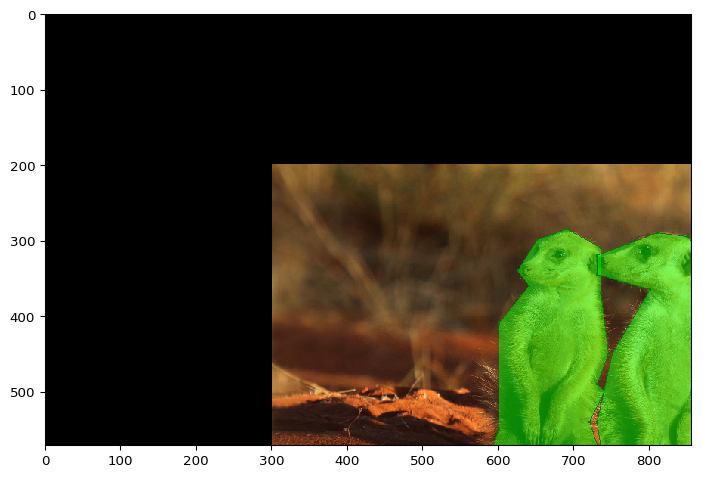

In [15]:
aug = iaa.Affine(translate_px={"y": 200, "x": 300})
aug_det = aug.to_deterministic()
image_aug = aug_det.augment_image(image)
psoi_aug = aug_det.augment_polygons(psoi)
ia.imshow(psoi_aug.draw_on_image(image_aug))

The drawing routine only draws the parts of polygons that can fit into the image area. By padding the image, we can visualize where our three polygons ended up:

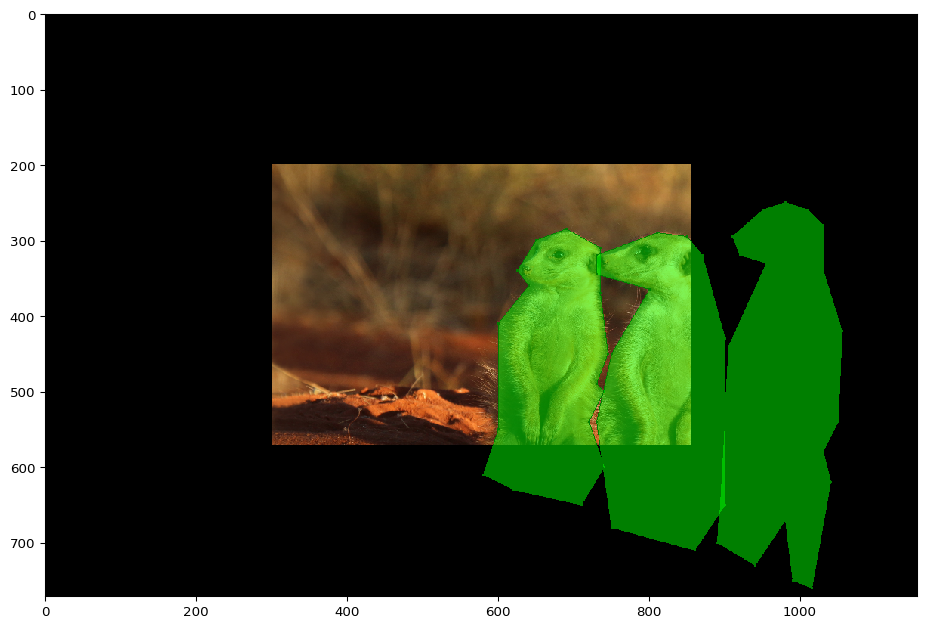

In [16]:
image_aug_pad = ia.pad(image_aug, bottom=200, right=300)
ia.imshow(psoi_aug.draw_on_image(image_aug_pad))

Let's first remove the polygon on the right, which is completely outside of the image area. We can do this by calling `PolygonsOnImage.remove_out_of_image(fully, partly)`. We don't want to remove the polygons that are only *partially* outside of the image area, hence we set `partly=False`.

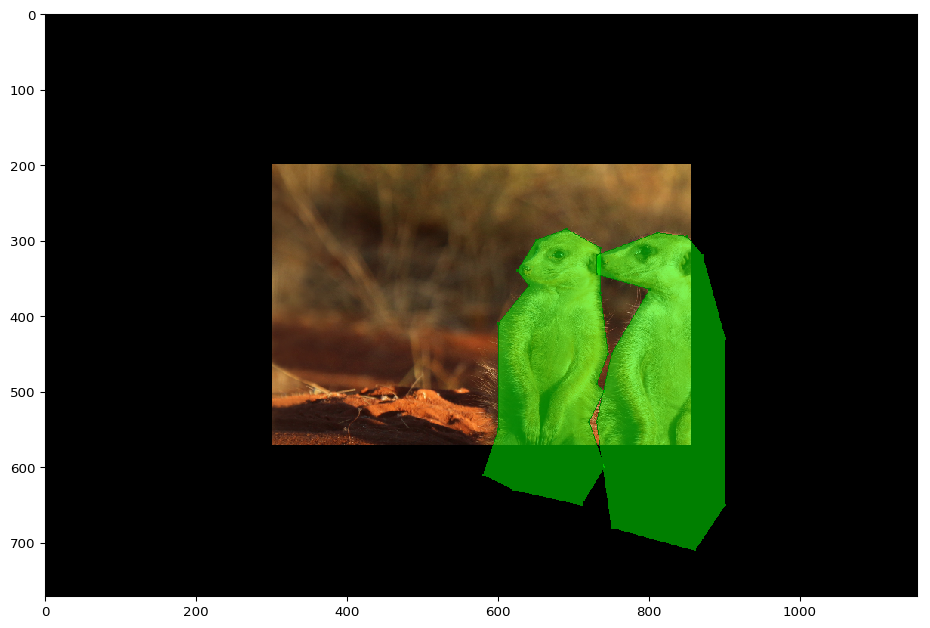

In [17]:
psoi_aug_removed = psoi_aug.remove_out_of_image(fully=True, partly=False)
ia.imshow(psoi_aug_removed.draw_on_image(image_aug_pad))

And now we clip the remaining polygons to the image area (the one *before* we padded, which's shape is saved in `PolygonsOnImage.shape`):

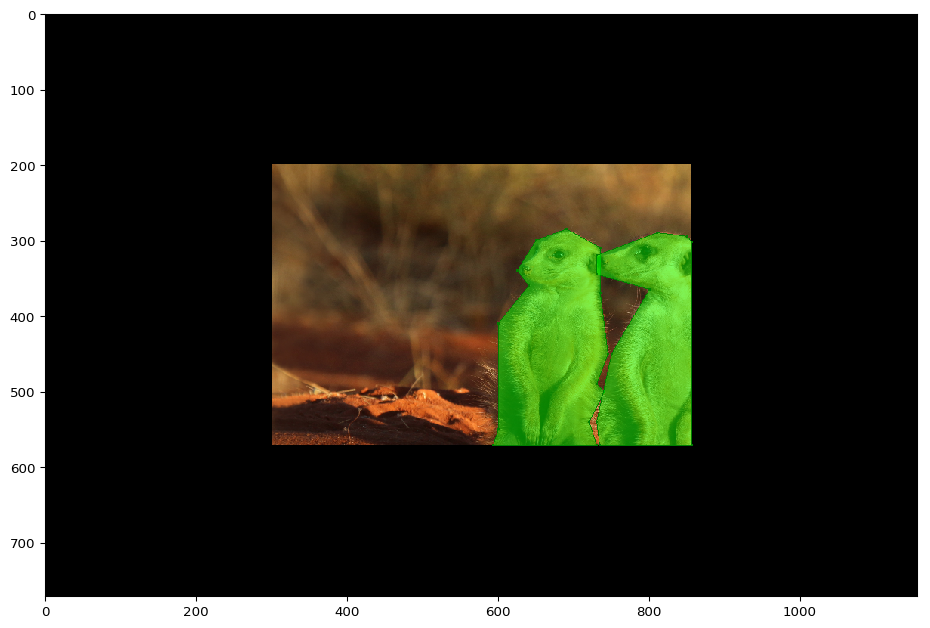

In [18]:
psoi_aug_removed_clipped = psoi_aug_removed.clip_out_of_image()
ia.imshow(psoi_aug_removed_clipped.draw_on_image(image_aug_pad))

You may wonder what would have happened if we had called `clip_out_of_image()` directly? Actually, the exactly same as above, as that method first removes any polygon that is completely outside of the image plane and then clips the remaining ones. The call of `remove_out_of_image()` was only added for illustration purposes here.

## Projecting Polygons onto other Images and Shifting Polygons

Resizing images is a common operation, which can be a bit annoying to perform when you have polygons on them. `imgaug` however offers a function to perform the necessary projection. Let's first increase the size of our example image to 1.2x its original size and visualize our polygons without any resizing:

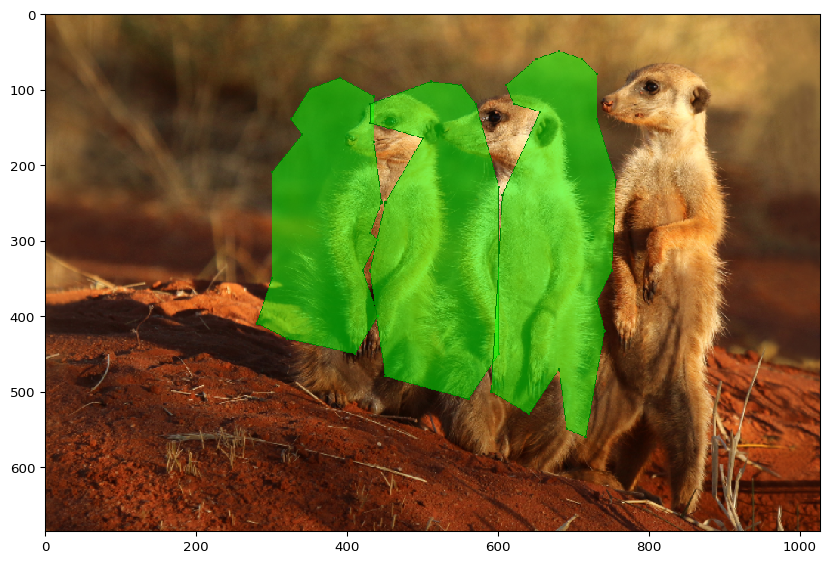

In [19]:
image_resized = ia.imresize_single_image(image, 1.2)
ia.imshow(psoi.draw_on_image(image_resized))

That doesn't look right. But resizing them is easy. We just call `PolygonsOnImage.on(new_shape)` on them to automatically recalculate all coordinates.

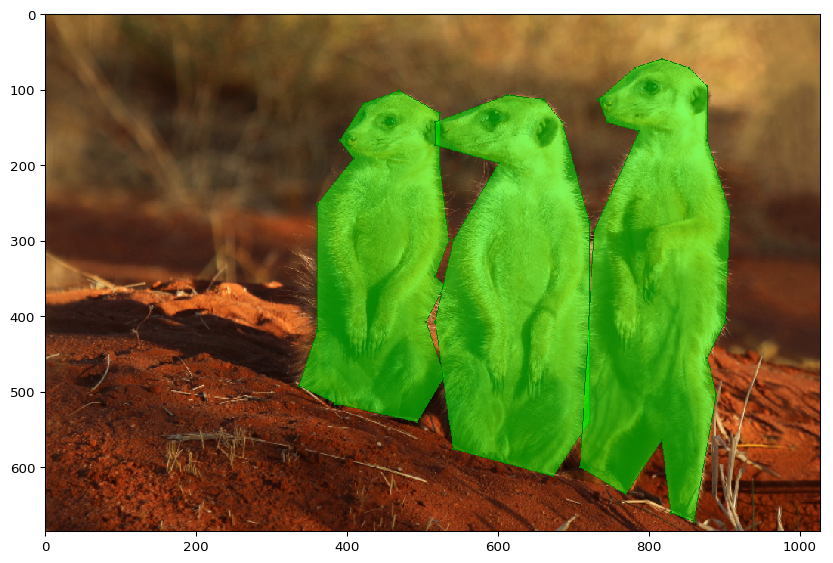

In [20]:
image_resized = ia.imresize_single_image(image, 1.2)
ia.imshow(psoi.on(image_resized).draw_on_image(image_resized))

You can also achieve the same if you only have `Polygon` instances and not a `PolygonsOnImage` instance. Simply call `Polygon.project(old_shape, new_shape)` on each one. The effect is the same, but because `Polygon` doesn't have a `.shape` attribute, you have to provide the old image's shape via `old_shape`.

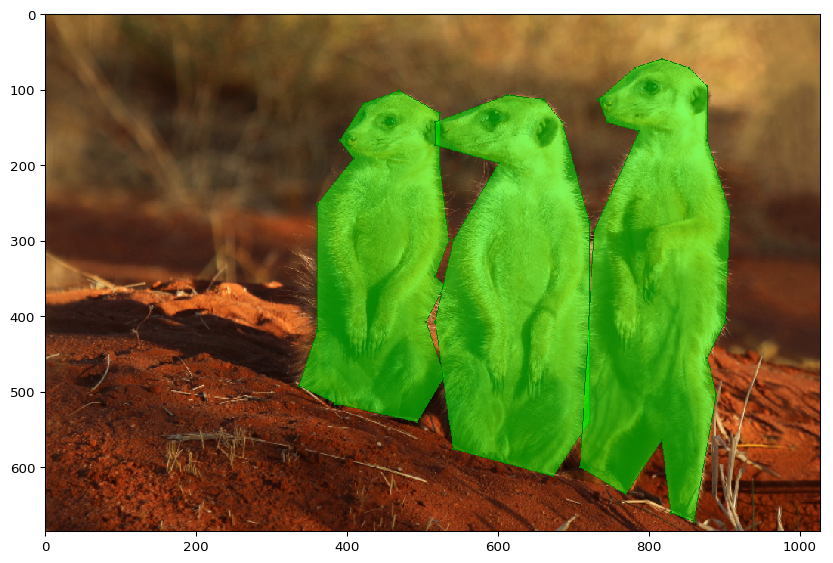

In [21]:
image_rs_polys = np.copy(image_resized)
image_rs_polys = meerkat_left.project(image.shape, image_resized.shape).draw_on_image(image_rs_polys)
image_rs_polys = meerkat_center.project(image.shape, image_resized.shape).draw_on_image(image_rs_polys)
image_rs_polys = meerkat_right.project(image.shape, image_resized.shape).draw_on_image(image_rs_polys)
ia.imshow(image_rs_polys)

The above methods however only work for resizing. Another common operation is image padding, which will cause similar issues:

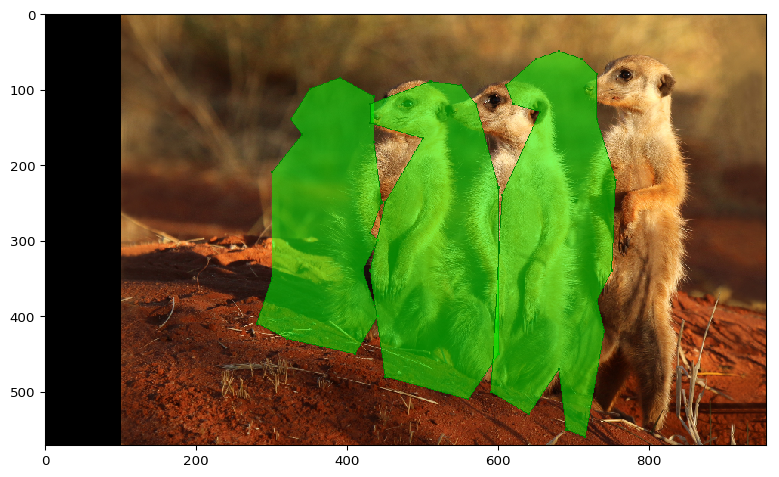

In [22]:
image_pad = ia.pad(image, left=100)
ia.imshow(psoi.draw_on_image(image_pad))

`PolygonsOnImage.on()` and `Polygon.project()` cannot be used here, because the relative corner coordinates changed and hence cannot be naively projected from the old to the padded image. The solution here is to simply move the polygons on the new image. This is achieved using `PolygonsOnImage.shift(top, right, bottom, left)` or the analogous `Polygon.shift(...)`, which both shift the polygon(s) from the provided side by the provided number of pixels. The image was padding by 100 pixels from the left, hence we shift the polygons by 100 pixels from the left side:

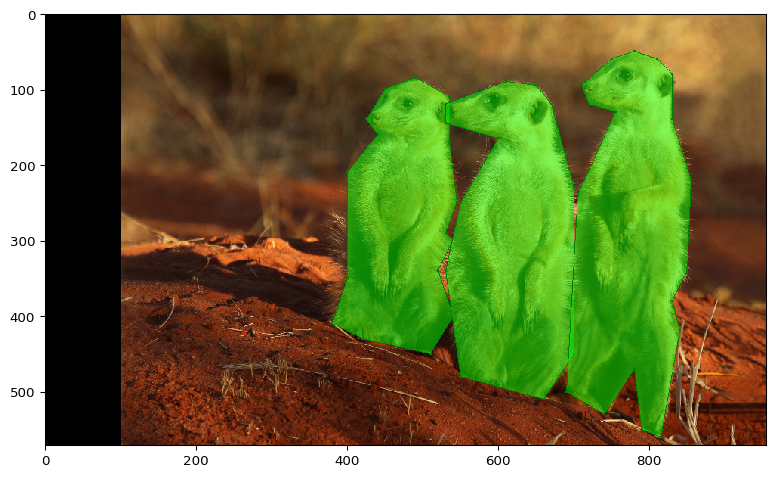

In [23]:
image_pad = ia.pad(image, left=100)
ia.imshow(psoi.shift(left=100).draw_on_image(image_pad))

## Computing Height, Width and Area

`Polygon` offers shortcuts in case you want to compute the height of a polygon (difference in y-coordinates between lowest and highest point) or its width (analogous) or its area:

In [24]:
print("Heights: %.2f, %.2f, %.2f" % (
    meerkat_left.height, meerkat_center.height, meerkat_right.height))
print("Widths : %.2f, %.2f, %.2f" % (
    meerkat_left.width, meerkat_center.width, meerkat_right.width))
print("Areas  : %.2f, %.2f, %.2f" % (
    meerkat_left.area, meerkat_center.area, meerkat_right.area))

Heights: 365.00, 420.00, 510.00
Widths : 165.00, 170.00, 165.00
Areas  : 43312.50, 56925.00, 59925.00


## Modifying the Polygon's Start Point

All polygons are made up of corner points, which again follow a certain order, with one point being the first one. In rare cases you might want to change that first point to another one, while keeping the remaining order. This is useful when interacting with the polygon, e.g. in an annotation tool to allow adding new corner points after a defined starting point and especially to allow changing this point in order to add new points at a different location.
This can be achieved in `imgaug` using the methods `Polygon.change_first_point_by_index(int index)` and `Polygon.change_first_point_by_coords(x, y, [max_distance], [raise_if_too_far_away])`. As their names indicate, they either pick the starting point according to its index in `Polygon.exterior` or by searching for the closest one to an image coordinate (euclidean distance).

To show both commands, let's first build an example. We use our previously loaded image and visualize one of the polygon's with its starting point.

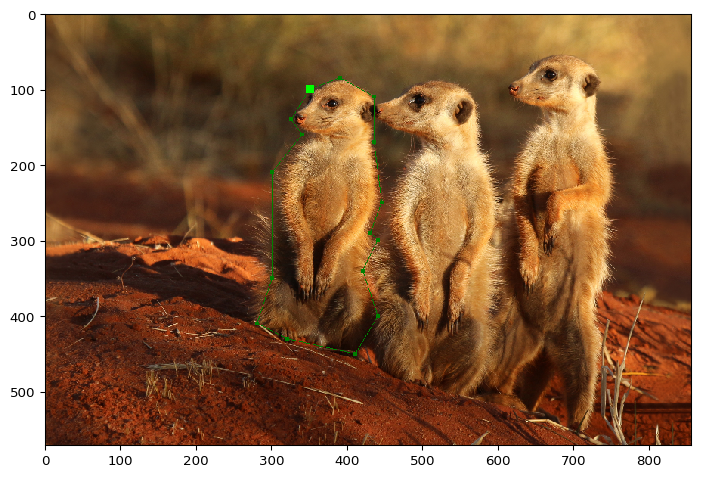

In [25]:
# visualize left meerkat's polygon
image_poly = meerkat_left.draw_on_image(image, size_points=5, alpha_fill=0)

# highlight the starting point, i.e. the first point in .exterior
first_point = meerkat_left.exterior[0]
first_point = ia.Keypoint(x=first_point[0], y=first_point[1])
image_poly = ia.KeypointsOnImage([first_point], shape=image.shape).draw_on_image(image_poly, size=11)

ia.imshow(image_poly)

Now let's reorder exterior so that the third point (index 2) becomes the first point. We call `Polygon.change_first_point_by_index()` for that. Note that this, like all methods of `Polygon`, returns a new `Polygon` instance and does not perform the reordering in-place.

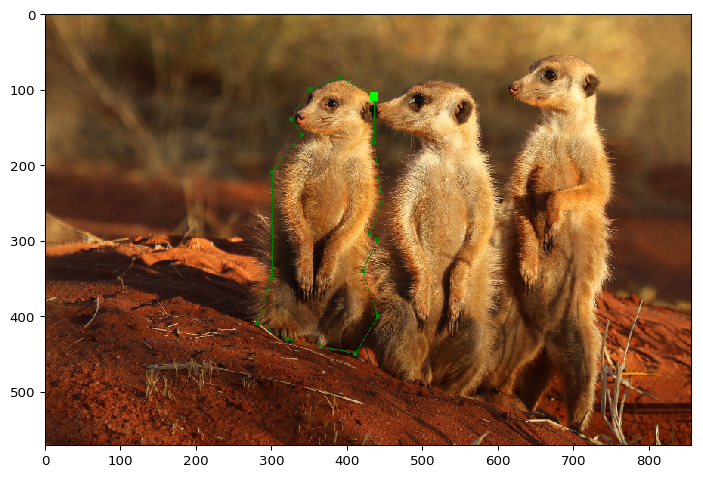

In [26]:
# change order
meerkat_left_reordered = meerkat_left.change_first_point_by_index(2)

# draw polygon
image_poly = meerkat_left_reordered.draw_on_image(image, size_points=5, alpha_fill=0)

# highlight first point
# we use here a slightly easier way than in the previous example, but it's effectively the same
first_point = meerkat_left_reordered.to_keypoints()[0]
image_poly = ia.KeypointsOnImage([first_point], shape=image.shape).draw_on_image(image_poly, size=11)

ia.imshow(image_poly)

And now let's choose the first point based on its coordinates via `change_first_point_by_coords()`. We choose the corner point that is closest to the bottom right corner of the image. For that, we have to set the argument `max_distance` to `None` as it is usually fairly limited.

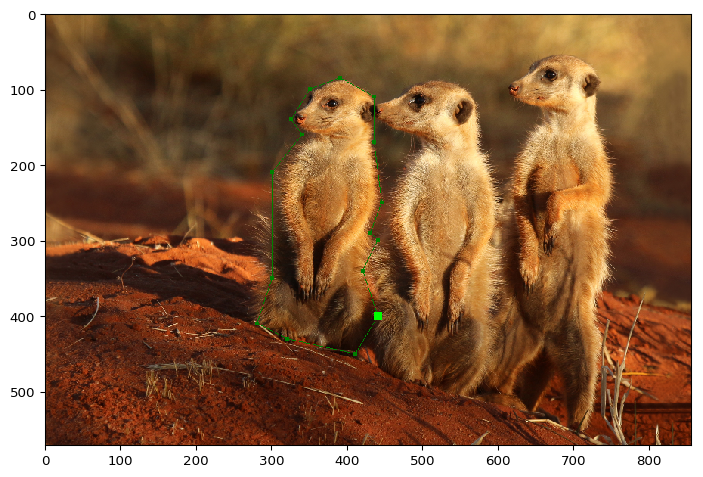

In [27]:
# reorder
meerkat_left_reordered = meerkat_left.change_first_point_by_coords(
    y=image.shape[0], x=image.shape[1], max_distance=None)

# visualize polygon
image_poly = meerkat_left_reordered.draw_on_image(image, size_points=5, alpha_fill=0)

# highlight first point
first_point = meerkat_left_reordered.to_keypoints()[0]
image_poly = ia.KeypointsOnImage([first_point], shape=image.shape).draw_on_image(image_poly, size=11)
ia.imshow(image_poly)

## Converting to Bounding Boxes

To quickly convert polygons to bounding boxes, you can use `Polygon.to_bounding_box()`. This is e.g. useful when the polygon's corner points were simply the extreme points of the object and the model is actually trained on the bounding box around these extreme points.

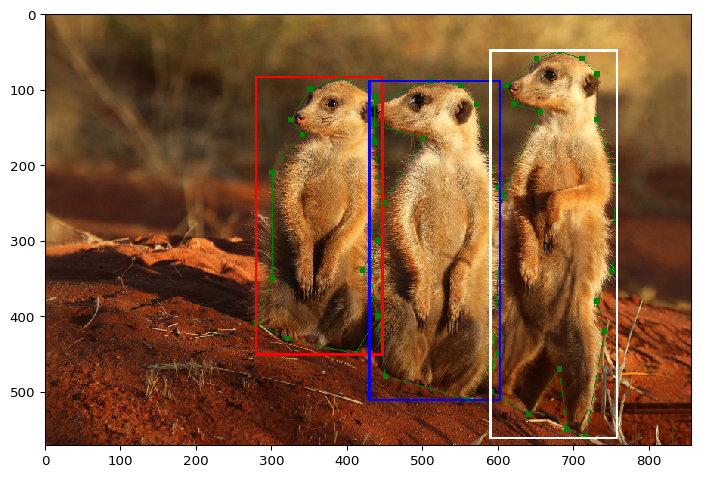

In [28]:
# convert our three polygons to bounding boxes
meerkat_left_bb = meerkat_left.to_bounding_box()
meerkat_center_bb = meerkat_center.to_bounding_box()
meerkat_right_bb = meerkat_right.to_bounding_box()

# visualize the bounding boxes, each with its own color
image_bbs = psoi.draw_on_image(image, alpha=1.0, alpha_fill=0, size_points=7)
image_bbs = meerkat_left_bb.draw_on_image(image_bbs, thickness=3, color=[255, 0, 0])
image_bbs = meerkat_center_bb.draw_on_image(image_bbs, thickness=3, color=[0, 0, 255])
image_bbs = meerkat_right_bb.draw_on_image(image_bbs, thickness=3, color=[255, 255, 255])
ia.imshow(image_bbs)

## Comparing Polygons

Comparing polygons with each other for equality can be a fairly difficult task, as e.g. the order of the corner points may be different or there might be additional points on the edges of one of the polygons. `imgaug` offers the method `Polygon.exterior_almost_equals(other_polygon, max_distance=1e-6, interpolate=8)` to compare two polygon's exteriors (`other_polygon` can also be a list of coordinates as tuples). It allows deviations of up to `max_distance` between each point and the closest edge on the other polygon, measured by euclidean distance. The method allows to interpolate additional points on the edges of the polygons, which decreased the probability of false positives.

Let's first see if our left and right meerkat polygons are identical:

In [29]:
print(meerkat_left.exterior_almost_equals(meerkat_left))
print(meerkat_left.exterior_almost_equals(meerkat_right))

True
False


As expected, the left polygon is identical to the left polygon (i.e. itself), but not to the right polygon.

Let's now shift the left polygon by one pixel from the left and compare it again to itself:

In [30]:
meerkat_left_shifted = meerkat_left.shift(left=1)
print(meerkat_left.exterior_almost_equals(meerkat_left_shifted))
print(meerkat_left.exterior_almost_equals(meerkat_left_shifted, max_distance=1))

False
True


Again, as expected it is evaluated as not being identical (first call). If however we increase the `max_distance` to one pixel it is (second call).

Let's now investigate closer some fringe cases. We start by creating two artifical polygons, both of them square reaching from 0 to 10 on the x and y axis:

In [31]:
poly_a = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10)])
poly_b = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10)])
print(poly_a.exterior_almost_equals(poly_b))

True


The two squares are identical and as expected are also evaluated as identical.

What happens if we add a point on one of the edges?

In [32]:
poly_a = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10)])
poly_b = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10), (0, 5)])
print(poly_a.exterior_almost_equals(poly_b, interpolate=0))

True


They are still evaluated as identical, even when not interpolating points. That is because the distance from each polygon's points to the other polygon's closest edge is considered. As the added point is on an edge, that distance is zero.

What happens if we add some area to one of the polygons, here by adding a very thin triangular structure on the left edge?

In [33]:
poly_a = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10)])
poly_b = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10), (0, 5.01), (-10, 5.0), (0, 4.99)])
print(poly_a.exterior_almost_equals(poly_b, interpolate=0))

False


As expected, the polygons are now evaluated as being unequal. That is because the end point of the triangle structure is far away from the closest edge of the other polygon.

What if we extend the that triangle not from the left edge towards the left, but towards the right and let it end on the right edge? Then the end point should have a distance of zero to the closest edge.

In [34]:
poly_a = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10)])
poly_b = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10), (0, 5.01), (10, 5.0), (0, 4.99)])
print(poly_a.exterior_almost_equals(poly_b, interpolate=0))

True


Indeed, the two polygons are falsely evaluated as identical. In this case, you could even make the triangle structure way less thin and it would still work. How to prevent that false positive? By adding some interpolated points on all edges:

In [35]:
poly_a = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10)])
poly_b = ia.Polygon([(0, 0), (10, 0), (10, 10), (0, 10), (0, 5.01), (10, 5.0), (0, 4.99)])
print(poly_a.exterior_almost_equals(poly_b, interpolate=8))

False


Now the exactly same structure is viewed as different, because some of the points interpolated on the triangle's edges are far away from the other polygon's closest edges.